In [ ]:
import numpy as np
import pandas as pd
import scipy.signal as signal
from tslearn.shapelets import ShapeletModel, grabocka_params_to_shapelet_size_dict
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
import warnings
import scipy.stats as stats
import nolds

warnings.filterwarnings("ignore", category=FutureWarning)

# PARAMETERS
fs, fc = 50, 10
window_size, step_size = 250, 125
min_duration_sec = 20
merge_gap_sec = 5
confidence_threshold = 0.8
#si filtre butterworth ⇒ besoin d’un resampling 
# FUNCTIONS
def butter_lowpass_filter(df, columns):
    b, a = signal.butter(3, fc / (fs / 2), btype='low')
    df[columns] = signal.filtfilt(b, a, df[columns], axis=0)
    return df

def load_accel_data(filepath):
    df = pd.read_csv(filepath)
    df.columns = ['date_time', 'X', 'Y', 'Z']
    df['date_time'] = pd.to_datetime(df['date_time'])
    df.set_index('date_time', inplace=True)
    return butter_lowpass_filter(df, ['X', 'Y', 'Z'])

def clean_activity_journal(filepath):
    act = pd.read_csv(filepath, sep=';', skipinitialspace=True)
    act.columns = act.columns.str.strip()
    act['date'] = pd.to_datetime("2024-04-15") + pd.to_timedelta(act['jour'], unit='D')

    def clean_time(t):
        if pd.isna(t) or not isinstance(t, str) or t.strip() == "":
            return np.nan
        t = t.strip().replace("h", ":")
        return t if ":" in t else t + ":00"

    act['debut'] = pd.to_datetime(act['date'].astype(str) + " " + act['debut'].astype(str).apply(clean_time), errors='coerce')
    act['fin'] = pd.to_datetime(act['date'].astype(str) + " " + act['fin'].astype(str).apply(clean_time), errors='coerce')
    return act

def extract_features(segment):
    feats = []
    for axis in range(3):
        sig = segment[:, axis]
        try:
            dfa_val = nolds.dfa(sig)
        except Exception:
            dfa_val = np.nan

        feats_axis = [
            np.mean(sig),
            np.std(sig),
            np.min(sig),
            np.max(sig),
            stats.skew(sig),
            stats.kurtosis(sig),
            dfa_val
        ]
        feats_axis = [f if np.isfinite(f) else 0.0 for f in feats_axis]
        feats.extend(feats_axis)
    return feats

def segment_and_label(df, act):
    segments, labels, features = [], [], []
    for _, row in act.iterrows():
        segment = df.loc[row['debut']:row['fin'], ['X', 'Y', 'Z']]
        for i in range(0, len(segment) - window_size, step_size):
            window = segment.iloc[i:i + window_size].values
            if np.std(window) > 0.02:
                segments.append(window)
                labels.append(row['activite'])
                features.append(extract_features(window))
    return np.array(segments, dtype=np.float32), np.array(labels), np.array(features)

def postprocess_predictions_all(timestamps, preds, min_dur=5, merge_gap=10):
    df_preds = pd.DataFrame({'timestamp': timestamps, 'prediction': preds})
    df_preds['prediction'] = df_preds['prediction'].astype(str)
    periods = []
    current_label, current_start = None, None
    for i in range(len(df_preds)):
        label = df_preds.loc[i, 'prediction']
        if label != current_label:
            if current_label is not None:
                end_time = df_preds.loc[i - 1, 'timestamp']
                periods.append((current_start, end_time, current_label))
            current_label = label
            current_start = df_preds.loc[i, 'timestamp']
    if current_label:
        periods.append((current_start, df_preds.iloc[-1]['timestamp'], current_label))

    cleaned = []
    for start, end, label in periods:
        duration = (end - start).total_seconds()
        if duration >= min_dur:
            if cleaned and (start - cleaned[-1][1]).total_seconds() <= merge_gap and cleaned[-1][2] == label:
                cleaned[-1] = (cleaned[-1][0], end, label)
            else:
                cleaned.append((start, end, label))
    return cleaned

# PIPELINE

df1 = load_accel_data('../data/Marion.lnk/MG_D.csv')
activity = clean_activity_journal('../data/activity_M.csv')

#  Exclure l'activité "Toilettes"
activity = activity[activity['activite'] != 'Toilettes']

X, y, X_feat = segment_and_label(df1, activity)

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

shapelet_sizes = grabocka_params_to_shapelet_size_dict(
    n_ts=len(X),
    ts_sz=X.shape[1],
    n_classes=len(np.unique(y)),
    l=0.1,
    r=1
)

shp_clf = ShapeletModel(
    n_shapelets_per_size=shapelet_sizes,
    optimizer="sgd",
    weight_regularizer=0.01,
    max_iter=50,
    verbose=1
)
shp_clf.fit(X, y_encoded)

X_shapelets = shp_clf.transform(X)
X_combined = np.hstack((X_shapelets, X_feat))

if np.isnan(X_combined).any():
    print("NaN values found in X_combined, replacing with 0.0")
    X_combined = np.nan_to_num(X_combined)

X_tr, X_val, y_tr, y_val = train_test_split(X_combined, y_encoded, test_size=0.2, random_state=42)
clf = LogisticRegression(max_iter=200)
clf.fit(X_tr, y_tr)

print("\n=== Classification Report (Validation) ===")
print(classification_report(y_val, clf.predict(X_val), target_names=label_encoder.classes_))

# UNLABELED DATA

df2 = load_accel_data('../data/Marion.lnk/MG_D2.csv')
df2_filtered = df2[df2.index < df2.index.min() + pd.Timedelta(days=2)]

segments_test, timestamps_test, X_feat_test = [], [], []
for i in range(0, len(df2_filtered) - window_size, step_size):
    seg = df2_filtered.iloc[i:i + window_size][['X', 'Y', 'Z']].values
    if np.std(seg) > 0.02:
        segments_test.append(seg)
        timestamps_test.append(df2_filtered.iloc[i].name)
        X_feat_test.append(extract_features(seg))

X_test = np.array(segments_test, dtype=np.float32)
X_feat_test = np.array(X_feat_test)

X_test_transformed = shp_clf.transform(X_test)
X_test_combined = np.hstack((X_test_transformed, X_feat_test))

if np.isnan(X_test_combined).any():
    print("NaN values found in X_test_combined, replacing with 0.0")
    X_test_combined = np.nan_to_num(X_test_combined)

proba_test = clf.predict_proba(X_test_combined)
pred_indices = np.argmax(proba_test, axis=1)
pred_probs = np.max(proba_test, axis=1)
y_pred_labels = label_encoder.inverse_transform(pred_indices)

# EXPORT

def final_prediction_summary():
    final_periods = postprocess_predictions_all(timestamps_test, y_pred_labels, min_dur=min_duration_sec, merge_gap=merge_gap_sec)
    df_periods = pd.DataFrame(final_periods, columns=['start_time', 'end_time', 'activity'])
    df_periods['day'] = df_periods['start_time'].dt.date
    df_periods['duration'] = df_periods['end_time'] - df_periods['start_time']
    print("\n=== Detected Activity Periods ===")
    print(df_periods)
    df_periods.to_csv('../data/Marion.lnk/detected_periods2.csv', index=False)
    return df_periods

final_prediction_summary()


/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/var/folders/x1/bx6lyj5s5833lk_2spqyq8180000g

Epoch 1/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - categorical_accuracy: 0.3287 - categorical_crossentropy: 2.1269 - loss: 2.1968
Epoch 2/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - categorical_accuracy: 0.4076 - categorical_crossentropy: 1.4213 - loss: 1.4863
Epoch 3/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - categorical_accuracy: 0.4117 - categorical_crossentropy: 1.3998 - loss: 1.4618
Epoch 4/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - categorical_accuracy: 0.4124 - categorical_crossentropy: 1.4087 - loss: 1.4679
Epoch 5/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - categorical_accuracy: 0.4160 - categorical_crossentropy: 1.4006 - loss: 1.4572
Epoch 6/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - categorical_accuracy: 0.4246 - categorical_crossentropy: 1.3934 - loss: 1.4476
Epoch 7/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - categorical_accuracy: 0.4351 - categorical_crossentropy: 1.3906 - loss: 1.4426
Epoch 8/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - categor

/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



=== Classification Report (Validation) ===
              precision    recall  f1-score   support

           A       0.55      0.64      0.59      1517
           H       0.32      0.24      0.27       471
           M       0.70      0.82      0.75      2596
           P       0.39      0.32      0.35       558
           S       0.30      0.10      0.15       470
           T       0.45      0.21      0.28       216

    accuracy                           0.60      5828
   macro avg       0.45      0.39      0.40      5828
weighted avg       0.56      0.60      0.57      5828



/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/var/folders/x1/bx6lyj5s5833lk_2spqyq8180000gn/T/ipykernel_4570/560951427.py:64: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  stats.skew(sig),
/var/folders/x1/bx6lyj5s5833lk_2spqyq8180000gn/T/ipykernel_4570/560951427.py:65: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  stats.kurtosis(sig),
/U

269/269 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step

=== Detected Activity Periods ===
                 start_time                end_time activity         day  \
0   2025-03-03 12:46:33.389 2025-03-03 12:47:01.198        A  2025-03-03   
1   2025-03-03 12:49:50.588 2025-03-03 12:50:15.865        A  2025-03-03   
2   2025-03-03 12:55:49.572 2025-03-03 12:56:14.862        M  2025-03-03   
3   2025-03-03 12:57:10.518 2025-03-03 12:57:30.752        P  2025-03-03   
4   2025-03-03 12:58:18.821 2025-03-03 12:58:39.048        P  2025-03-03   
..                      ...                     ...      ...         ...   
873 2025-03-05 12:08:11.825 2025-03-05 12:08:59.820        M  2025-03-05   
874 2025-03-05 12:09:17.506 2025-03-05 12:11:06.082        M  2025-03-05   
875 2025-03-05 12:16:06.341 2025-03-05 12:16:41.653        M  2025-03-05   
876 2025-03-05 12:42:10.578 2025-03-05 12:42:38.327        A  2025-03-05   
877 2025-03-05 12:44:29.304 2025-03-05 12:44:59.574        M  2025-03-05   

           

,start_time,end_time,activity,day,duration
0,2025-03-03 12:46:33.389,2025-03-03 12:47:01.198,A,2025-03-03,0 days 00:00:27.809000
1,2025-03-03 12:49:50.588,2025-03-03 12:50:15.865,A,2025-03-03,0 days 00:00:25.277000
2,2025-03-03 12:55:49.572,2025-03-03 12:56:14.862,M,2025-03-03,0 days 00:00:25.290000
3,2025-03-03 12:57:10.518,2025-03-03 12:57:30.752,P,2025-03-03,0 days 00:00:20.234000
4,2025-03-03 12:58:18.821,2025-03-03 12:58:39.048,P,2025-03-03,0 days 00:00:20.227000
...,...,...,...,...,...
873,2025-03-05 12:08:11.825,2025-03-05 12:08:59.820,M,2025-03-05,0 days 00:00:47.995000
874,2025-03-05 12:09:17.506,2025-03-05 12:11:06.082,M,2025-03-05,0 days 00:01:48.576000
875,2025-03-05 12:16:06.341,2025-03-05 12:16:41.653,M,2025-03-05,0 days 00:00:35.312000
876,2025-03-05 12:42:10.578,2025-03-05 12:42:38.327,A,2025-03-05,0 days 00:00:27.749000


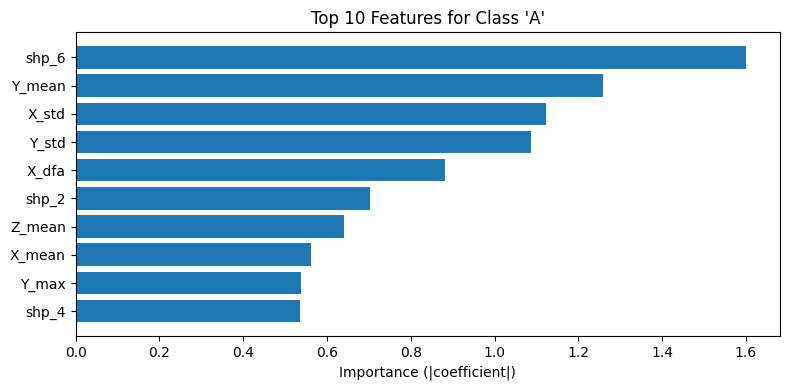

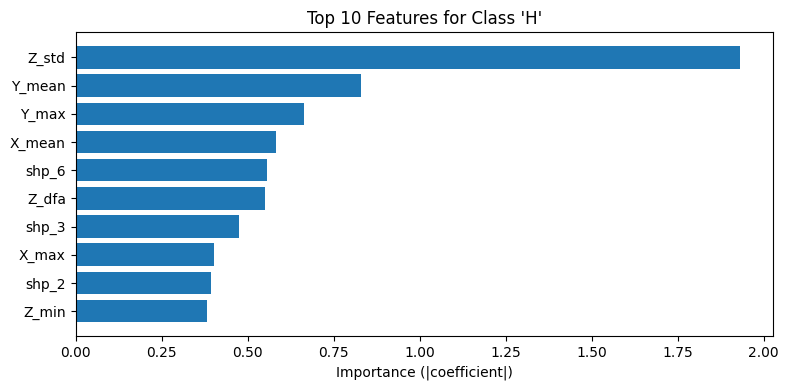

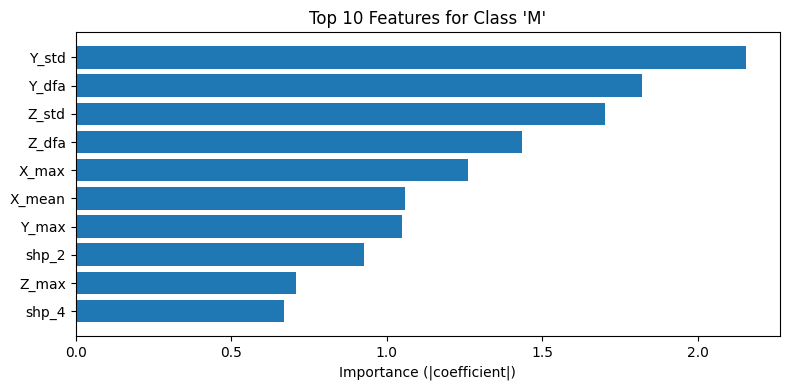

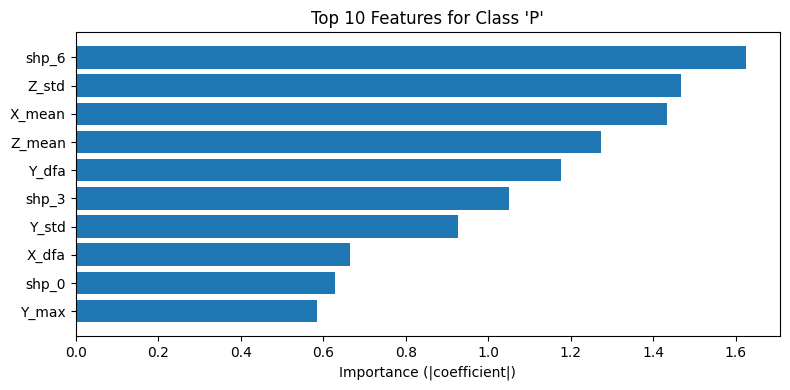

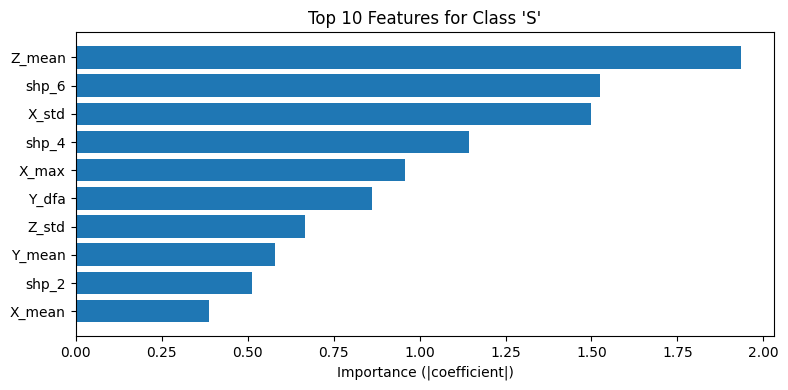

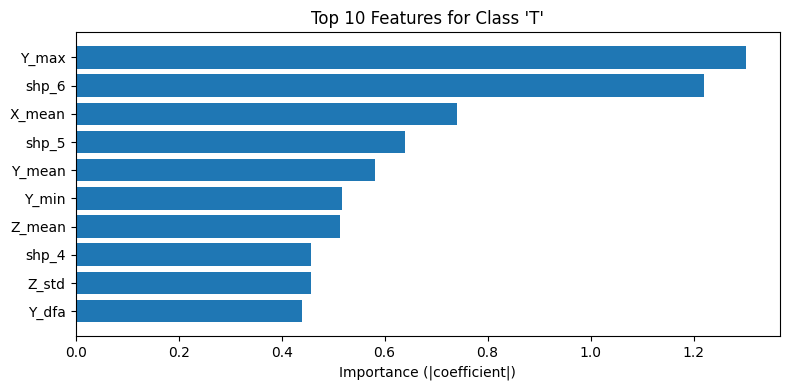


=== Top 10 descripteurs par classe ===

Classe 'A':
  shp_6                -> 1.6014
  Y_mean               -> 1.2586
  X_std                -> 1.1227
  Y_std                -> 1.0874
  X_dfa                -> 0.8819
  shp_2                -> 0.7030
  Z_mean               -> 0.6408
  X_mean               -> 0.5613
  Y_max                -> 0.5371
  shp_4                -> 0.5362

Classe 'H':
  Z_std                -> 1.9307
  Y_mean               -> 0.8296
  Y_max                -> 0.6642
  X_mean               -> 0.5817
  shp_6                -> 0.5556
  Z_dfa                -> 0.5504
  shp_3                -> 0.4759
  X_max                -> 0.4033
  shp_2                -> 0.3924
  Z_min                -> 0.3811

Classe 'M':
  Y_std                -> 2.1560
  Y_dfa                -> 1.8201
  Z_std                -> 1.7009
  Z_dfa                -> 1.4334
  X_max                -> 1.2621
  X_mean               -> 1.0590
  Y_max                -> 1.0491
  shp_2                -> 0.92

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Recréer les noms de descripteurs
feature_names = [f"{axis}_{stat}" for axis in ["X", "Y", "Z"] for stat in ["mean", "std", "min", "max", "skew", "kurtosis", "dfa"]]
shapelet_names = [f"shp_{i}" for i in range(X_shapelets.shape[1])]
combined_names = shapelet_names + feature_names

# Récupérer les coefficients du modèle pour chaque classe
coefs = clf.coef_  # shape: (n_classes, n_features)

# Pour chaque classe, afficher les 10 features les plus importantes
top_features_by_class = {}

for idx, class_label in enumerate(label_encoder.classes_):
    class_coefs = np.abs(coefs[idx])  # Importance absolue
    top_indices = np.argsort(class_coefs)[-10:][::-1]  # Top 10 indices
    top_features = [(combined_names[i], class_coefs[i]) for i in top_indices]
    top_features_by_class[class_label] = top_features

    # Affichage graphique
    plt.figure(figsize=(8, 4))
    plt.barh([f[0] for f in top_features[::-1]], [f[1] for f in top_features[::-1]])
    plt.xlabel("Importance (|coefficient|)")
    plt.title(f"Top 10 Features for Class '{class_label}'")
    plt.tight_layout()
    plt.show()

# Affichage console
print("\n=== Top 10 descripteurs par classe ===")
for class_label, features in top_features_by_class.items():
    print(f"\nClasse '{class_label}':")
    for name, coef in features:
        print(f"  {name:20s} -> {coef:.4f}")


/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/var/folders/x1/bx6lyj5s5833lk_2spqyq8180000gn/T/ipykernel_4570/3471618778.py:64: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  stats.skew(sig),
/var/folders/x1/bx6lyj5s5833lk_2spqyq8180000gn/T/ipykernel_4570/3471618778.py:65: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  stats.kurtosis(sig),


Epoch 1/100
114/114 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - categorical_accuracy: 0.3987 - categorical_crossentropy: 1.7115 - loss: 1.7827
Epoch 2/100
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - categorical_accuracy: 0.4383 - categorical_crossentropy: 1.4267 - loss: 1.4922
Epoch 3/100
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - categorical_accuracy: 0.4438 - categorical_crossentropy: 1.4019 - loss: 1.4639
Epoch 4/100
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - categorical_accuracy: 0.4469 - categorical_crossentropy: 1.3825 - loss: 1.4418
Epoch 5/100
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - categorical_accuracy: 0.4492 - categorical_crossentropy: 1.3692 - loss: 1.4262
Epoch 6/100
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - categorical_accuracy: 0.4550 - categorical_crossentropy: 1.3478 - loss: 1.4030
Epoch 7/100
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - categorical_accuracy: 0.4544 - categorical_crossentropy: 1.3456 - loss: 1.3992
Epoch 8/100
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step -

/var/folders/x1/bx6lyj5s5833lk_2spqyq8180000gn/T/ipykernel_4570/3471618778.py:64: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  stats.skew(sig),
/var/folders/x1/bx6lyj5s5833lk_2spqyq8180000gn/T/ipykernel_4570/3471618778.py:65: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  stats.kurtosis(sig),
/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/leoolivier/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


269/269 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step

=== Detected Activity Periods ===
                  start_time                end_time activity         day  \
0    2025-03-03 12:49:43.003 2025-03-03 12:50:13.341        A  2025-03-03   
1    2025-03-03 12:50:31.027 2025-03-03 12:50:56.316        P  2025-03-03   
2    2025-03-03 12:53:12.822 2025-03-03 12:53:40.630        H  2025-03-03   
3    2025-03-03 12:56:32.573 2025-03-03 12:56:52.806        H  2025-03-03   
4    2025-03-03 12:58:18.821 2025-03-03 12:58:39.048        P  2025-03-03   
...                      ...                     ...      ...         ...   
1002 2025-03-05 12:31:34.628 2025-03-05 12:31:57.335        P  2025-03-05   
1003 2025-03-05 12:34:41.360 2025-03-05 12:35:16.681        P  2025-03-05   
1004 2025-03-05 12:37:07.718 2025-03-05 12:37:37.988        M  2025-03-05   
1005 2025-03-05 12:43:06.076 2025-03-05 12:43:38.867        H  2025-03-05   
1006 2025-03-05 12:43:54.005 2025-03-05 12:44:59.574        M  2025-03-05   

,start_time,end_time,activity,day,duration
0,2025-03-03 12:49:43.003,2025-03-03 12:50:13.341,A,2025-03-03,0 days 00:00:30.338000
1,2025-03-03 12:50:31.027,2025-03-03 12:50:56.316,P,2025-03-03,0 days 00:00:25.289000
2,2025-03-03 12:53:12.822,2025-03-03 12:53:40.630,H,2025-03-03,0 days 00:00:27.808000
3,2025-03-03 12:56:32.573,2025-03-03 12:56:52.806,H,2025-03-03,0 days 00:00:20.233000
4,2025-03-03 12:58:18.821,2025-03-03 12:58:39.048,P,2025-03-03,0 days 00:00:20.227000
...,...,...,...,...,...
1002,2025-03-05 12:31:34.628,2025-03-05 12:31:57.335,P,2025-03-05,0 days 00:00:22.707000
1003,2025-03-05 12:34:41.360,2025-03-05 12:35:16.681,P,2025-03-05,0 days 00:00:35.321000
1004,2025-03-05 12:37:07.718,2025-03-05 12:37:37.988,M,2025-03-05,0 days 00:00:30.270000
1005,2025-03-05 12:43:06.076,2025-03-05 12:43:38.867,H,2025-03-05,0 days 00:00:32.791000


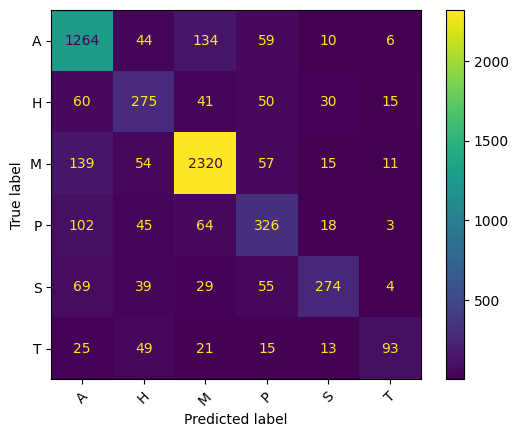

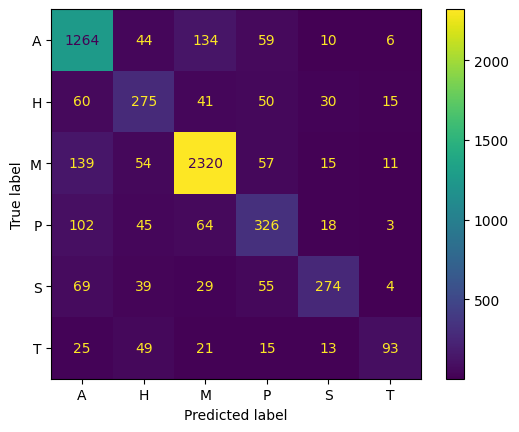

In [6]:
import numpy as np
import pandas as pd
import scipy.signal as signal
from tslearn.shapelets import ShapeletModel, grabocka_params_to_shapelet_size_dict
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
import warnings
import scipy.stats as stats
import nolds

warnings.filterwarnings("ignore", category=FutureWarning)

# PARAMETERS
fs, fc = 50, 10
window_size, step_size = 250, 125
min_duration_sec = 20
merge_gap_sec = 5
confidence_threshold = 0.8

# FUNCTIONS
def butter_lowpass_filter(df, columns):
    b, a = signal.butter(3, fc / (fs / 2), btype='low')
    df[columns] = signal.filtfilt(b, a, df[columns], axis=0)
    return df

def load_accel_data(filepath):
    df = pd.read_csv(filepath)
    df.columns = ['date_time', 'X', 'Y', 'Z']
    df['date_time'] = pd.to_datetime(df['date_time'])
    df.set_index('date_time', inplace=True)
    return butter_lowpass_filter(df, ['X', 'Y', 'Z'])

def clean_activity_journal(filepath):
    act = pd.read_csv(filepath, sep=';', skipinitialspace=True)
    act.columns = act.columns.str.strip()
    act['date'] = pd.to_datetime("2024-04-15") + pd.to_timedelta(act['jour'], unit='D')

    def clean_time(t):
        if pd.isna(t) or not isinstance(t, str) or t.strip() == "":
            return np.nan
        t = t.strip().replace("h", ":")
        return t if ":" in t else t + ":00"

    act['debut'] = pd.to_datetime(act['date'].astype(str) + " " + act['debut'].astype(str).apply(clean_time), errors='coerce')
    act['fin'] = pd.to_datetime(act['date'].astype(str) + " " + act['fin'].astype(str).apply(clean_time), errors='coerce')
    return act

def extract_features(segment):
    feats = []
    for axis in range(3):
        sig = segment[:, axis]
        try:
            dfa_val = nolds.dfa(sig)
        except Exception:
            dfa_val = np.nan

        feats_axis = [
            np.mean(sig),
            np.std(sig),
            np.min(sig),
            np.max(sig),
            stats.skew(sig),
            stats.kurtosis(sig),
            dfa_val
        ]
        feats_axis = [f if np.isfinite(f) else 0.0 for f in feats_axis]
        feats.extend(feats_axis)

    # Ajout des features sur la norme
    norm = np.linalg.norm(segment[:, :3], axis=1)
    try:
        dfa_val_norm = nolds.dfa(norm)
    except Exception:
        dfa_val_norm = np.nan

    feats_norm = [
        np.mean(norm), np.std(norm), np.min(norm), np.max(norm),
        stats.skew(norm), stats.kurtosis(norm), dfa_val_norm
    ]
    feats_norm = [f if np.isfinite(f) else 0.0 for f in feats_norm]
    feats.extend(feats_norm)

    return feats

def segment_and_label(df, act):
    segments, labels, features = [], [], []
    for _, row in act.iterrows():
        segment = df.loc[row['debut']:row['fin'], ['X', 'Y', 'Z']]
        for i in range(0, len(segment) - window_size, step_size):
            window_xyz = segment.iloc[i:i + window_size].values
            norm = np.linalg.norm(window_xyz, axis=1).reshape(-1, 1)
            window = np.hstack((window_xyz, norm))
            if np.std(window) > 0.02:
                segments.append(window)
                labels.append(row['activite'])
                features.append(extract_features(window))
    return np.array(segments, dtype=np.float32), np.array(labels), np.array(features)

def postprocess_predictions_all(timestamps, preds, min_dur=5, merge_gap=10):
    df_preds = pd.DataFrame({'timestamp': timestamps, 'prediction': preds})
    df_preds['prediction'] = df_preds['prediction'].astype(str)
    periods = []
    current_label, current_start = None, None
    for i in range(len(df_preds)):
        label = df_preds.loc[i, 'prediction']
        if label != current_label:
            if current_label is not None:
                end_time = df_preds.loc[i - 1, 'timestamp']
                periods.append((current_start, end_time, current_label))
            current_label = label
            current_start = df_preds.loc[i, 'timestamp']
    if current_label:
        periods.append((current_start, df_preds.iloc[-1]['timestamp'], current_label))

    cleaned = []
    for start, end, label in periods:
        duration = (end - start).total_seconds()
        if duration >= min_dur:
            if cleaned and (start - cleaned[-1][1]).total_seconds() <= merge_gap and cleaned[-1][2] == label:
                cleaned[-1] = (cleaned[-1][0], end, label)
            else:
                cleaned.append((start, end, label))
    return cleaned

# PIPELINE

df1 = load_accel_data('../data/Marion.lnk/MG_D.csv')
activity = clean_activity_journal('../data/activity_M.csv')
activity = activity[activity['activite'] != 'Toilettes']

X, y, X_feat = segment_and_label(df1, activity)

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

shapelet_sizes = grabocka_params_to_shapelet_size_dict(
    n_ts=len(X),
    ts_sz=X.shape[1],
    n_classes=len(np.unique(y)),
    l=0.05,
    r=2
)

shp_clf = ShapeletModel(
    n_shapelets_per_size=shapelet_sizes,
    optimizer="sgd",
    weight_regularizer=0.01,
    max_iter=100,
    verbose=1
)
shp_clf.fit(X, y_encoded)

X_shapelets = shp_clf.transform(X)
X_combined = np.hstack((X_shapelets, X_feat))

if np.isnan(X_combined).any():
    print("NaN values found in X_combined, replacing with 0.0")
    X_combined = np.nan_to_num(X_combined)

X_tr, X_val, y_tr, y_val = train_test_split(X_combined, y_encoded, test_size=0.2, random_state=42)
clf = RandomForestClassifier(n_estimators=200, random_state=42)
clf.fit(X_tr, y_tr)

print("\n=== Classification Report (Validation) ===")
print(classification_report(y_val, clf.predict(X_val), target_names=label_encoder.classes_))
ConfusionMatrixDisplay.from_estimator(clf, X_val, y_val, display_labels=label_encoder.classes_, xticks_rotation=45).plot()

# UNLABELED DATA

df2 = load_accel_data('../data/Marion.lnk/MG_D2.csv')
df2_filtered = df2[df2.index < df2.index.min() + pd.Timedelta(days=2)]

segments_test, timestamps_test, X_feat_test = [], [], []
for i in range(0, len(df2_filtered) - window_size, step_size):
    seg_xyz = df2_filtered.iloc[i:i + window_size][['X', 'Y', 'Z']].values
    norm = np.linalg.norm(seg_xyz, axis=1).reshape(-1, 1)
    seg = np.hstack((seg_xyz, norm))
    if np.std(seg) > 0.02:
        segments_test.append(seg)
        timestamps_test.append(df2_filtered.iloc[i].name)
        X_feat_test.append(extract_features(seg))

X_test = np.array(segments_test, dtype=np.float32)
X_feat_test = np.array(X_feat_test)

X_test_transformed = shp_clf.transform(X_test)
X_test_combined = np.hstack((X_test_transformed, X_feat_test))

if np.isnan(X_test_combined).any():
    print("NaN values found in X_test_combined, replacing with 0.0")
    X_test_combined = np.nan_to_num(X_test_combined)

proba_test = clf.predict_proba(X_test_combined)
pred_indices = np.argmax(proba_test, axis=1)
pred_probs = np.max(proba_test, axis=1)
y_pred_labels = label_encoder.inverse_transform(pred_indices)

# EXPORT
def final_prediction_summary():
    final_periods = postprocess_predictions_all(timestamps_test, y_pred_labels, min_dur=min_duration_sec, merge_gap=merge_gap_sec)
    df_periods = pd.DataFrame(final_periods, columns=['start_time', 'end_time', 'activity'])
    df_periods['day'] = df_periods['start_time'].dt.date
    df_periods['duration'] = df_periods['end_time'] - df_periods['start_time']
    print("\n=== Detected Activity Periods ===")
    print(df_periods)
    df_periods.to_csv('../data/Marion.lnk/detected_periods2.csv', index=False)
    return df_periods

final_prediction_summary()

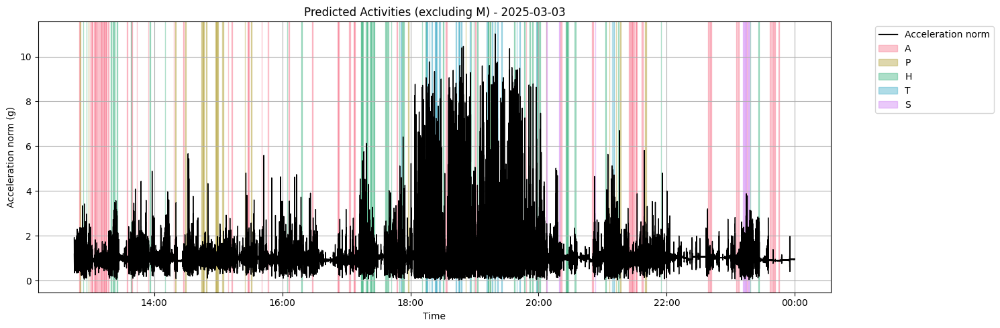

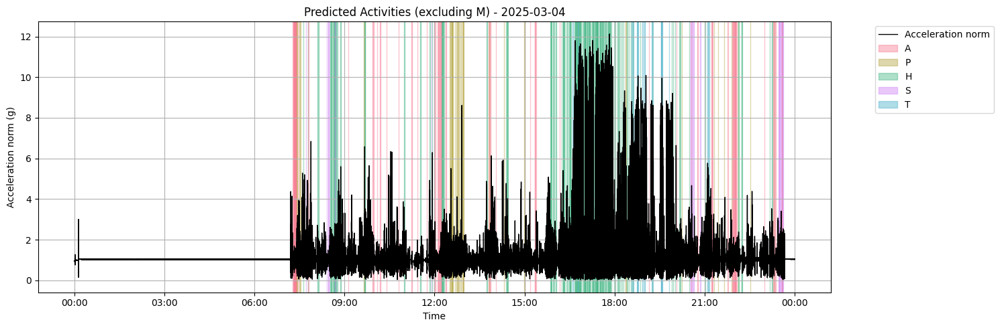

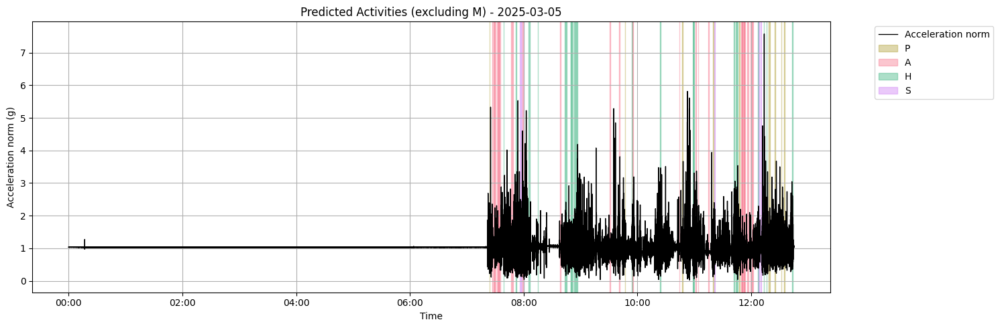

In [9]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

# Calcul de la norme
df2['norm'] = np.linalg.norm(df2[['X', 'Y', 'Z']].values, axis=1)
df2_visu = df2[df2.index < df2.index.min() + pd.Timedelta(days=2)]

# Filtrer les prédictions (exclure "M")
df_preds = pd.DataFrame(detected_periods, columns=['start_time', 'end_time', 'activity'])
df_preds = df_preds[df_preds['activity'] != 'M']

# Palette de couleurs cohérente
activity_list = df_preds['activity'].unique()
activity_colors = dict(zip(activity_list, sns.color_palette("husl", len(activity_list))))

# Affichage jour par jour
days = df2_visu.index.normalize().unique()

for day in days:
    day_start = day
    day_end = day + pd.Timedelta(days=1)
    df_day = df2_visu[(df2_visu.index >= day_start) & (df2_visu.index < day_end)]
    preds_day = df_preds[(df_preds['start_time'] >= day_start) & (df_preds['start_time'] < day_end)]

    fig, ax = plt.subplots(figsize=(15, 5))
    ax.plot(df_day.index, df_day['norm'], label='Acceleration norm', color='black', linewidth=1)

    for _, row in preds_day.iterrows():
        ax.axvspan(row['start_time'], row['end_time'], alpha=0.4, color=activity_colors[row['activity']], label=row['activity'])

    # Nettoyer la légende pour éviter les doublons
    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))
    ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

    ax.set_title(f'Predicted Activities (excluding M) - {day.date()}')
    ax.set_ylabel('Acceleration norm (g)')
    ax.set_xlabel('Time')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    plt.tight_layout()
    plt.grid(True)
    plt.show()


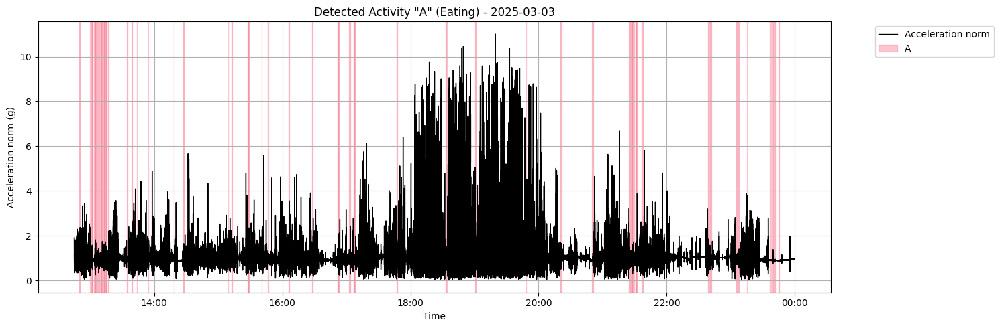

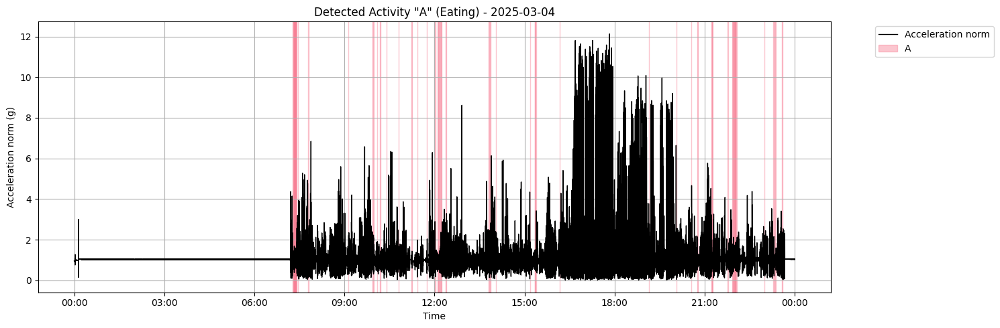

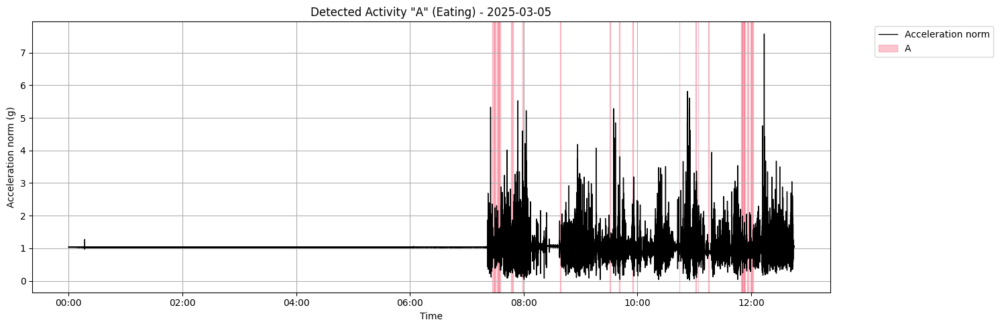

In [ ]:
# Calcul de la norme
df2['norm'] = np.linalg.norm(df2[['X', 'Y', 'Z']].values, axis=1)
df2_visu = df2[df2.index < df2.index.min() + pd.Timedelta(days=2)]

# Filtrer pour ne garder que l'activité "A"
df_preds = pd.DataFrame(detected_periods, columns=['start_time', 'end_time', 'activity'])
df_preds = df_preds[df_preds['activity'] == 'A']

# Couleur unique pour "A"
activity_colors = {'A': sns.color_palette("husl", 1)[0]}

# Affichage jour par jour
days = df2_visu.index.normalize().unique()

for day in days:
    day_start = day
    day_end = day + pd.Timedelta(days=1)
    df_day = df2_visu[(df2_visu.index >= day_start) & (df2_visu.index < day_end)]
    preds_day = df_preds[(df_preds['start_time'] >= day_start) & (df_preds['start_time'] < day_end)]

    fig, ax = plt.subplots(figsize=(15, 5))
    ax.plot(df_day.index, df_day['norm'], label='Acceleration norm', color='black', linewidth=1)

    for _, row in preds_day.iterrows():
        ax.axvspan(row['start_time'], row['end_time'], alpha=0.4, color=activity_colors['A'], label='A')

    # Nettoyage légende
    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))
    ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

    ax.set_title(f'Detected Activity \"A\" (Eating) - {day.date()}')
    ax.set_ylabel('Acceleration norm (g)')
    ax.set_xlabel('Time')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    plt.tight_layout()
    plt.grid(True)
    plt.show()



=== Best Parameters Based on F1-score ===
gap_min             15.000000
min_duration_min     5.000000
precision            0.666667
recall               0.571429
f1_score             0.615385
Name: 7, dtype: float64

=== Detection Scores for Activity 'A' ===
Precision: 0.67
Recall:    0.57
F1-score:  0.62


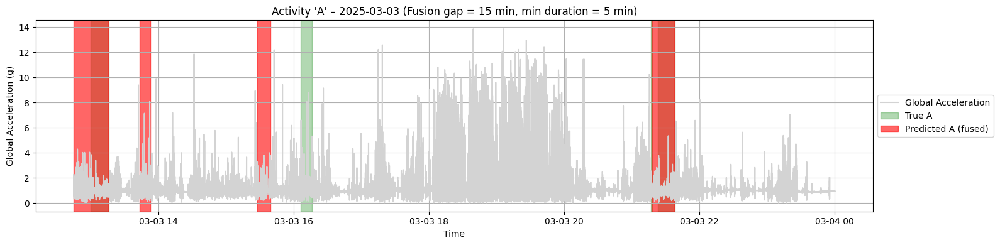

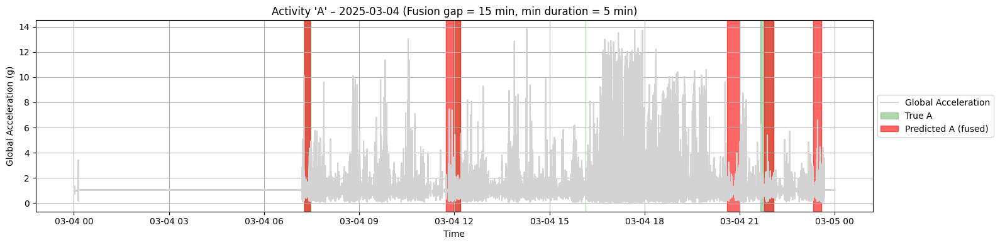

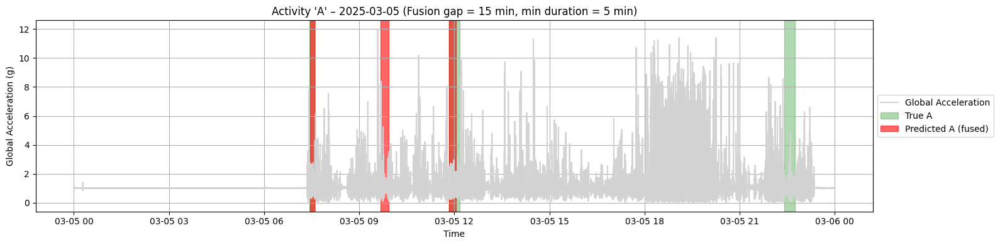

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta
import itertools

# === PARAMÈTRES INITIAUX ===
def compute_overlap_score(pred_df, true_df):
    TP, FP, FN = 0, 0, 0
    matched_pred = set()
    matched_true = set()

    for i, true_row in true_df.iterrows():
        for j, pred_row in pred_df.iterrows():
            latest_start = max(true_row['start_time'], pred_row['start_time'])
            earliest_end = min(true_row['end_time'], pred_row['end_time'])
            overlap = (earliest_end - latest_start).total_seconds()
            if overlap > 0:
                matched_pred.add(j)
                matched_true.add(i)
                break

    TP = len(matched_true)
    FN = len(true_df) - TP
    FP = len(pred_df) - TP

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0.0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0.0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0

    return precision, recall, f1

def fuse_periods(df, max_gap_min=10, min_duration_min=3):
    merged = []
    for day, group in df.groupby('day'):
        group = group.sort_values(by='start_time').reset_index(drop=True)
        current_start = group.loc[0, 'start_time']
        current_end = group.loc[0, 'end_time']
        for i in range(1, len(group)):
            gap = (group.loc[i, 'start_time'] - current_end).total_seconds() / 60.0
            if gap <= max_gap_min:
                current_end = max(current_end, group.loc[i, 'end_time'])
            else:
                duration = (current_end - current_start).total_seconds() / 60.0
                if duration >= min_duration_min:
                    merged.append({'start_time': current_start, 'end_time': current_end, 'day': day})
                current_start = group.loc[i, 'start_time']
                current_end = group.loc[i, 'end_time']
        duration = (current_end - current_start).total_seconds() / 60.0
        if duration >= min_duration_min:
            merged.append({'start_time': current_start, 'end_time': current_end, 'day': day})
    return pd.DataFrame(merged)

# === CHARGEMENT DES DONNÉES ===
df_pred = pd.read_csv('../data/Marion.lnk/detected_all_periods.csv')
df_pred['start_time'] = pd.to_datetime(df_pred['start_time'])
df_pred['end_time'] = pd.to_datetime(df_pred['end_time'])
df_pred['day'] = df_pred['start_time'].dt.date
df_pred = df_pred[df_pred['activity'] == 'A']

activity2 = pd.read_csv('../data/activity_M2.csv', sep=';', skipinitialspace=True)
activity2.columns = activity2.columns.str.strip()
activity2['start_time'] = pd.to_datetime(activity2['heure'] + ' ' + activity2['debut'])
activity2['end_time'] = pd.to_datetime(activity2['heure'] + ' ' + activity2['fin'])
activity2['day'] = activity2['start_time'].dt.date
activity2 = activity2[activity2['activite'] == 'A']

df2 = pd.read_csv('../data/Marion.lnk/MG_D2.csv')
df2.columns = ['date_time', 'X', 'Y', 'Z']
df2['date_time'] = pd.to_datetime(df2['date_time'])
df2['acceleration'] = (df2[['X', 'Y', 'Z']] ** 2).sum(axis=1).pow(0.5)

# === RECHERCHE DU MEILLEUR GAP ET DUREE MINIMALE ===
gap_values = [5, 10, 15]
duration_values = [3, 5, 7]
results = []

for gap_min, min_duration_min in itertools.product(gap_values, duration_values):
    df_fused_A = fuse_periods(df_pred, max_gap_min=gap_min, min_duration_min=min_duration_min)
    precision, recall, f1 = compute_overlap_score(df_fused_A, activity2)
    results.append({
        'gap_min': gap_min,
        'min_duration_min': min_duration_min,
        'precision': precision,
        'recall': recall,
        'f1_score': f1
    })

results_df = pd.DataFrame(results)
best_row = results_df.sort_values(by='f1_score', ascending=False).iloc[0]

print("\n=== Best Parameters Based on F1-score ===")
print(best_row)

# Réutiliser les meilleurs paramètres trouvés
gap_min = int(best_row['gap_min'])
min_duration_min = int(best_row['min_duration_min'])
df_fused_A = fuse_periods(df_pred, max_gap_min=gap_min, min_duration_min=min_duration_min)

# === CALCUL DES SCORES DE DÉTECTION ===
precision, recall, f1 = compute_overlap_score(df_fused_A, activity2)
print("\n=== Detection Scores for Activity 'A' ===")
print(f"Precision: {precision:.2f}")
print(f"Recall:    {recall:.2f}")
print(f"F1-score:  {f1:.2f}")

# === AFFICHAGE JOUR PAR JOUR ===
days = sorted(set(df_fused_A['day']).intersection(set(activity2['day'])))

for day in days:
    df_day = df2[df2['date_time'].dt.date == day]
    if df_day.empty:
        continue

    real_A = activity2[activity2['day'] == day]
    pred_A = df_fused_A[df_fused_A['day'] == day]

    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(df_day['date_time'], df_day['acceleration'], color='lightgray', label='Global Acceleration')

    for _, row in real_A.iterrows():
        ax.axvspan(row['start_time'], row['end_time'], color='green', alpha=0.3,
                   label='True A' if 'True A' not in ax.get_legend_handles_labels()[1] else None)

    for _, row in pred_A.iterrows():
        ax.axvspan(row['start_time'], row['end_time'], color='red', alpha=0.6,
                   label='Predicted A (fused)' if 'Predicted A (fused)' not in ax.get_legend_handles_labels()[1] else None)

    ax.set_title(f"Activity 'A' – {day} (Fusion gap = {gap_min} min, min duration = {min_duration_min} min)")
    ax.set_xlabel("Time")
    ax.set_ylabel("Global Acceleration (g)")
    ax.grid(True)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.tight_layout()
    plt.show()


In [42]:
import matplotlib.patches as patches
import matplotlib.dates as mdates
from datetime import timedelta

def plot_gantt_chart(real_df, pred_df, day,
                     show_legend=True,
                     show_night_shading=True,
                     use_hatching=False,
                     annotate_scores=False,
                     f1_score=None,
                     precision=None,
                     recall=None):

    fig, ax = plt.subplots(figsize=(14, 3))
    bar_height = 0.4

    # === Fond nuit (trame 0h-6h et 22h-24h)
    if show_night_shading:
        ax.axvspan(pd.Timestamp(f"{day} 00:00"), pd.Timestamp(f"{day} 06:00"), color='lightblue', alpha=0.05)
        ax.axvspan(pd.Timestamp(f"{day} 22:00"), pd.Timestamp(f"{day} 23:59"), color='lightblue', alpha=0.05)

    # === Réel (ligne 1)
    for _, row in real_df.iterrows():
        ax.barh(y=1, width=row['end_time'] - row['start_time'],
                left=row['start_time'], height=bar_height,
                color='green', alpha=0.5)

    # === Prédit (ligne 0)
    if use_hatching:
        for _, row in pred_df.iterrows():
            ax.add_patch(patches.Rectangle(
                (row['start_time'], 0 - bar_height/2),
                row['end_time'] - row['start_time'],
                bar_height,
                hatch='///', fill=True, edgecolor='red',
                facecolor='none', linewidth=0.0, alpha=0.8
            ))
    else:
        for _, row in pred_df.iterrows():
            ax.barh(y=0, width=row['end_time'] - row['start_time'],
                    left=row['start_time'], height=bar_height,
                    color='red', alpha=0.6)

    # === Mise en forme
    ax.set_xlim(day, day + timedelta(days=1))
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    plt.xticks(rotation=45)

    ax.set_yticks([0, 1])
    ax.set_yticklabels(["Predicted A", "True A"])
    ax.set_ylim(-0.8, 1.8)

    ax.set_title(f"Gantt Chart – Activity 'A' on {day}")
    ax.set_xlabel("Time")
    ax.grid(True, axis='x', linestyle='--', alpha=0.3)

    # === Légende
    if show_legend:
        handles = [
            patches.Patch(color='green', alpha=0.5, label="True A"),
            patches.Patch(color='red', alpha=0.6, label="Predicted A" if not use_hatching else "Predicted A (hatch)")
        ]
        ax.legend(handles=handles, loc="lower right")

    # === Annotation des scores
    if annotate_scores and f1_score is not None:
        ax.text(1.01, 1, f"Precision: {precision:.2f}\nRecall: {recall:.2f}\nF1-score: {f1_score:.2f}",
                transform=ax.transAxes, va='center', ha='left', fontsize=10)

    plt.tight_layout()
    plt.show()


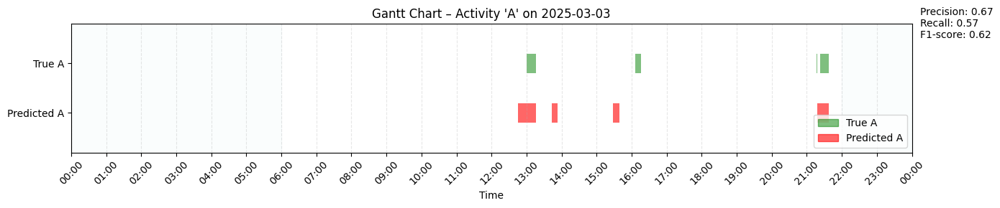

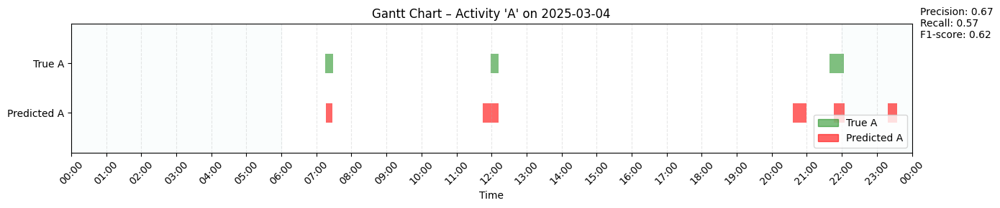

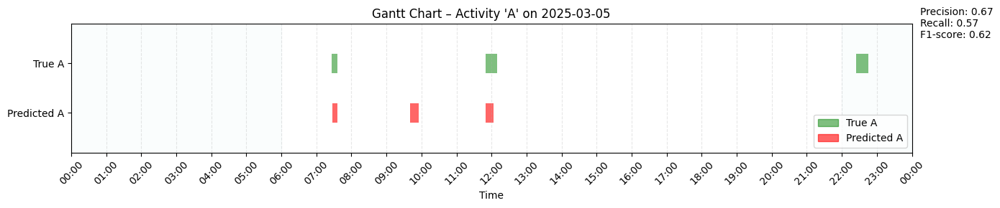

In [43]:
for day in days:
    real_A = activity2[activity2['day'] == day]
    pred_A = df_fused_A[df_fused_A['day'] == day]
    
    plot_gantt_chart(
        real_df=real_A,
        pred_df=pred_A,
        day=day,
        show_legend=True,
        show_night_shading=True,
        use_hatching=False,         # Mets True pour test avec /// sur prédictions
        annotate_scores=True,
        f1_score=f1,
        precision=precision,
        recall=recall
    )


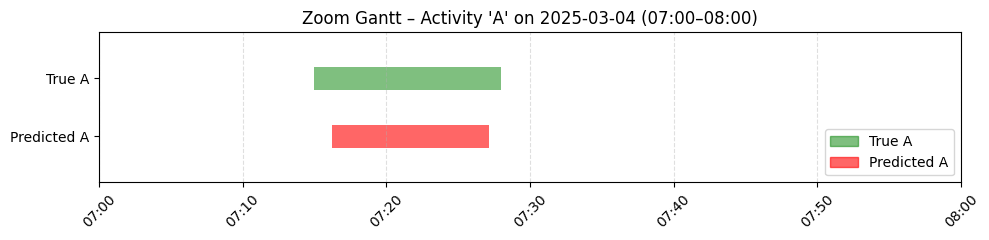

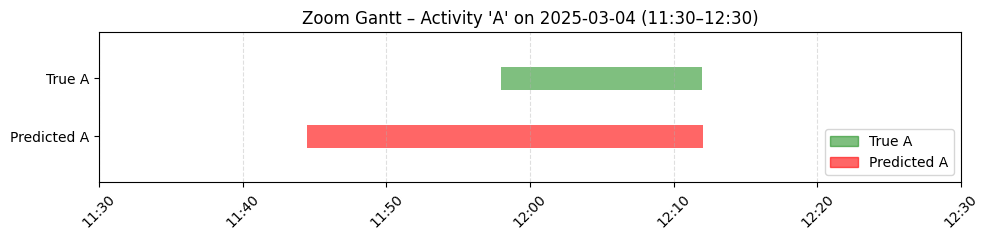

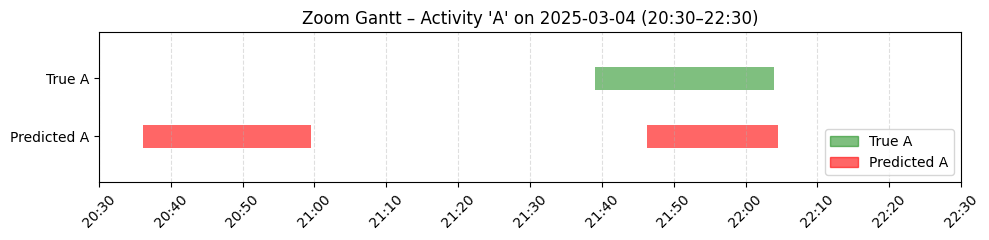

In [44]:
from datetime import datetime

# === Spécifie le jour et les fenêtres horaires de zoom ===
day = pd.to_datetime("2025-03-04").date()
windows = [
    ("07:00", "08:00"),
    ("11:30", "12:30"),
    ("20:30", "22:30")
]

# === Filtrage des périodes réelles et prédites pour ce jour
real_A = activity2[activity2['day'] == day]
pred_A = df_fused_A[df_fused_A['day'] == day]

# === Boucle sur les plages horaires à zoomer
for start_str, end_str in windows:
    start_time = pd.Timestamp(f"{day} {start_str}")
    end_time = pd.Timestamp(f"{day} {end_str}")

    fig, ax = plt.subplots(figsize=(10, 2.5))
    bar_height = 0.4

    # Réel
    for _, row in real_A.iterrows():
        if row['end_time'] > start_time and row['start_time'] < end_time:
            ax.barh(y=1, width=min(row['end_time'], end_time) - max(row['start_time'], start_time),
                    left=max(row['start_time'], start_time), height=bar_height,
                    color='green', alpha=0.5)

    # Prédit
    for _, row in pred_A.iterrows():
        if row['end_time'] > start_time and row['start_time'] < end_time:
            ax.barh(y=0, width=min(row['end_time'], end_time) - max(row['start_time'], start_time),
                    left=max(row['start_time'], start_time), height=bar_height,
                    color='red', alpha=0.6)

    ax.set_xlim(start_time, end_time)
    ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    plt.xticks(rotation=45)

    ax.set_yticks([0, 1])
    ax.set_yticklabels(["Predicted A", "True A"])
    ax.set_ylim(-0.8, 1.8)
    ax.set_title(f"Zoom Gantt – Activity 'A' on {day} ({start_str}–{end_str})")
    ax.grid(True, axis='x', linestyle='--', alpha=0.4)

    # Légende
    handles = [
        patches.Patch(color='green', alpha=0.5, label="True A"),
        patches.Patch(color='red', alpha=0.6, label="Predicted A")
    ]
    ax.legend(handles=handles, loc="lower right")

    plt.tight_layout()
    plt.show()


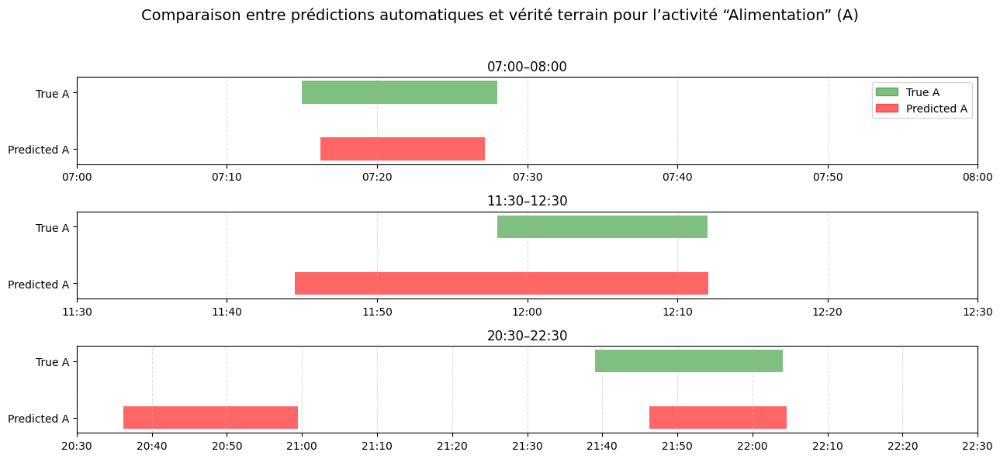

In [56]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as patches
import pandas as pd
from datetime import datetime

# === Paramètres
day = pd.to_datetime("2025-03-04").date()
windows = [
    ("07:00", "08:00"),
    ("11:30", "12:30"),
    ("20:30", "22:30")
]

# === Données réelles et prédites
real_A = activity2[activity2['day'] == day]
pred_A = df_fused_A[df_fused_A['day'] == day]

# === Création du graphe multi-fenêtres
fig, axs = plt.subplots(nrows=3, figsize=(13, 6), sharey=True)

for i, (start_str, end_str) in enumerate(windows):
    ax = axs[i]
    start_time = pd.Timestamp(f"{day} {start_str}")
    end_time = pd.Timestamp(f"{day} {end_str}")
    bar_height = 0.4

    # Réel
    for _, row in real_A.iterrows():
        if row['end_time'] > start_time and row['start_time'] < end_time:
            ax.barh(y=1,
                    width=max(pd.Timedelta(seconds=30), min(row['end_time'], end_time) - max(row['start_time'], start_time)),
                    left=max(row['start_time'], start_time),
                    height=bar_height,
                    color='green', alpha=0.5)

    # Prédit
    for _, row in pred_A.iterrows():
        if row['end_time'] > start_time and row['start_time'] < end_time:
            ax.barh(y=0,
                    width=max(pd.Timedelta(seconds=30), min(row['end_time'], end_time) - max(row['start_time'], start_time)),
                    left=max(row['start_time'], start_time),
                    height=bar_height,
                    color='red', alpha=0.6)

    ax.set_xlim(start_time, end_time)
    ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    ax.set_yticks([0, 1])
    ax.set_yticklabels(["Predicted A", "True A"])
    ax.grid(True, axis='x', linestyle='--', alpha=0.4)
    ax.set_title(f"{start_str}–{end_str}")

# === Légende et titre global
handles = [
    patches.Patch(color='green', alpha=0.5, label="True A"),
    patches.Patch(color='red', alpha=0.6, label="Predicted A")
]
axs[0].legend(handles=handles, loc="upper right")
fig.suptitle("Comparaison entre prédictions automatiques et vérité terrain pour l’activité “Alimentation” (A)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Laisser de la place pour le titre
plt.show()


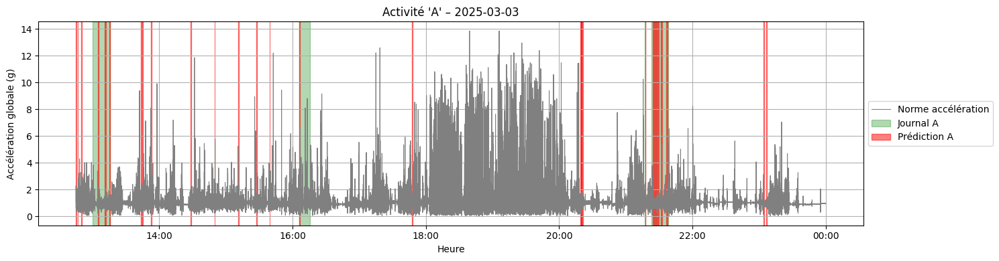

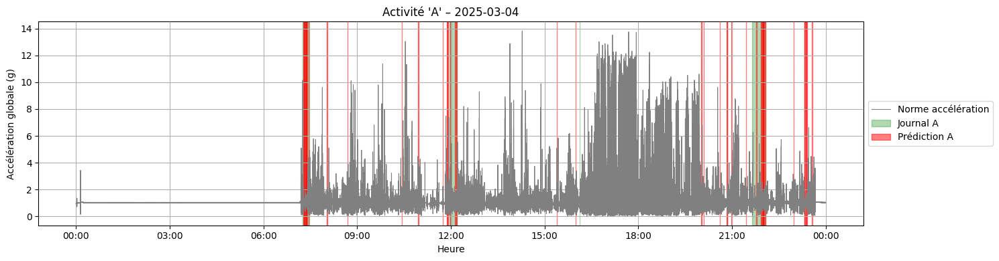

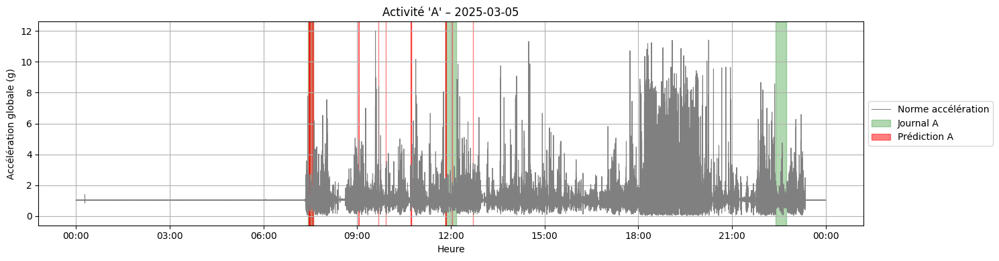

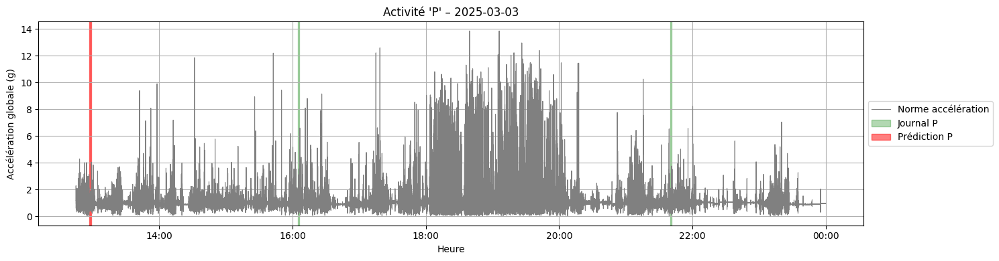

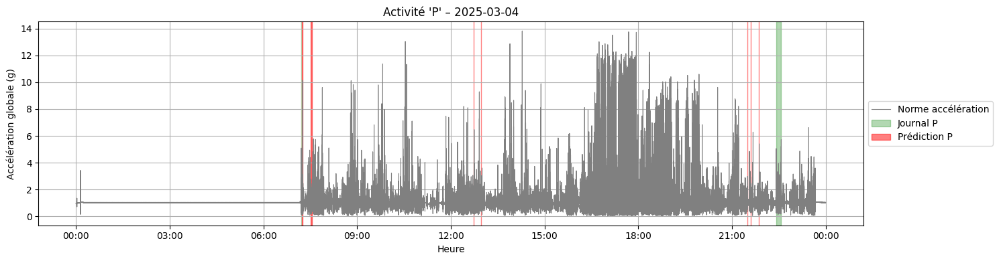

...

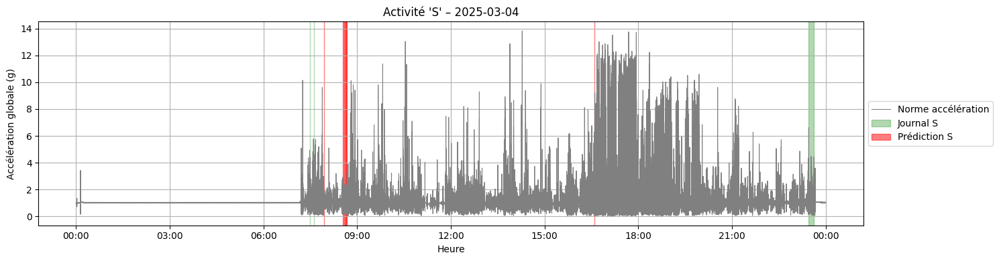

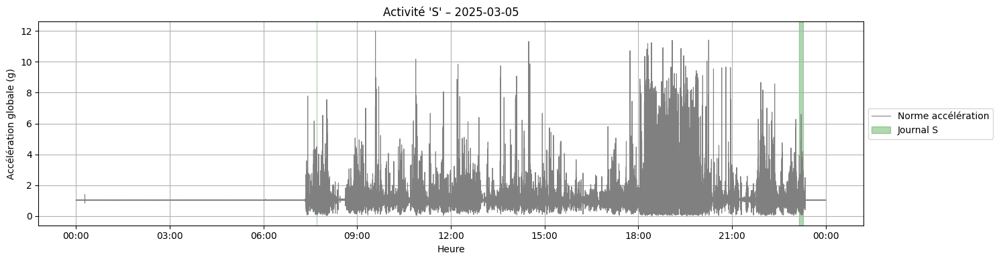

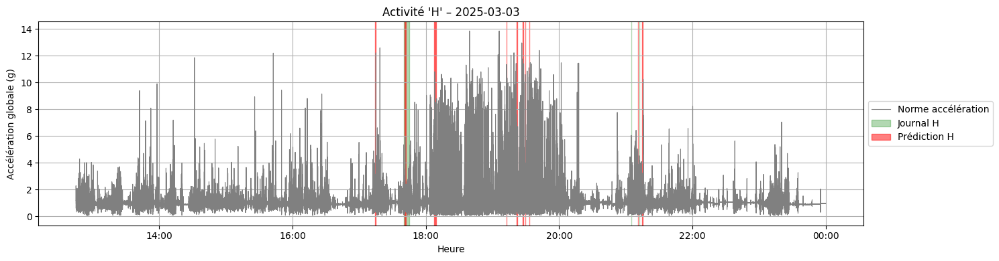

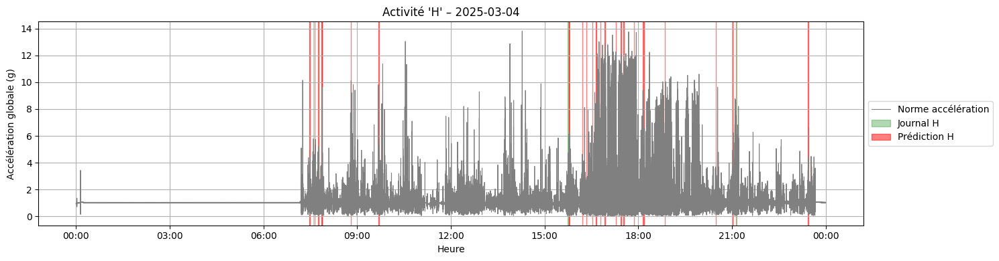

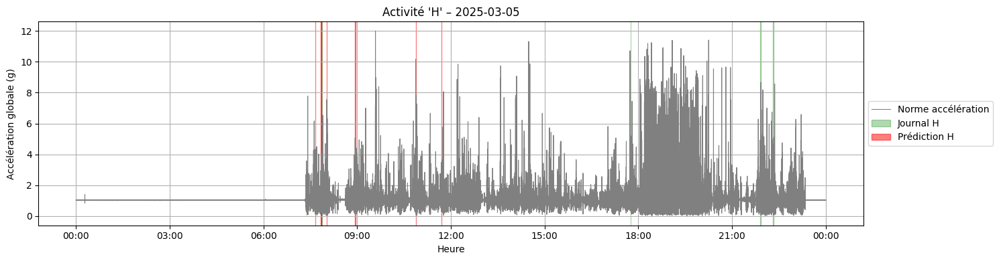

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# === Chargement des données ===
# df2 : données d'accélération (X, Y, Z)
df2 = pd.read_csv('../data/Marion.lnk/MG_D2.csv')
df2.columns = ['date_time', 'X', 'Y', 'Z']
df2['date_time'] = pd.to_datetime(df2['date_time'])
df2['acceleration'] = np.linalg.norm(df2[['X', 'Y', 'Z']].values, axis=1)

# df_pred : périodes prédites après post-traitement
df_pred = pd.read_csv('../data/Marion.lnk/detected_all_periods.csv')
df_pred['start_time'] = pd.to_datetime(df_pred['start_time'])
df_pred['end_time'] = pd.to_datetime(df_pred['end_time'])
df_pred['day'] = df_pred['start_time'].dt.date

# activity2 : journal d’activités
activity2 = pd.read_csv('../data/activity_M2.csv', sep=';', skipinitialspace=True)
activity2.columns = activity2.columns.str.strip()
activity2['start_time'] = pd.to_datetime(activity2['heure'] + ' ' + activity2['debut'])
activity2['end_time'] = pd.to_datetime(activity2['heure'] + ' ' + activity2['fin'])
activity2['day'] = activity2['start_time'].dt.date

# === Activités ciblées ===
target_activities = ['A', 'P', 'S', 'H']

# === Boucle par activité et par jour ===
common_days = sorted(set(df_pred['day']).intersection(set(activity2['day'])))

for activity in target_activities:
    for day in common_days:
        df_day = df2[df2['date_time'].dt.date == day]
        if df_day.empty:
            continue

        preds_day = df_pred[(df_pred['day'] == day) & (df_pred['activity'] == activity)]
        true_day = activity2[(activity2['day'] == day) & (activity2['activite'] == activity)]

        fig, ax = plt.subplots(figsize=(15, 4))
        ax.plot(df_day['date_time'], df_day['acceleration'], color='gray', linewidth=0.8, label='Norme accélération')

        # Journal d’activité en vert pâle
        for _, row in true_day.iterrows():
            ax.axvspan(row['start_time'], row['end_time'],
                       color='green', alpha=0.3,
                       label='Journal ' + activity if 'Journal ' + activity not in ax.get_legend_handles_labels()[1] else None)

        # Prédictions en rouge
        for _, row in preds_day.iterrows():
            ax.axvspan(row['start_time'], row['end_time'],
                       color='red', alpha=0.5,
                       label='Prédiction ' + activity if 'Prédiction ' + activity not in ax.get_legend_handles_labels()[1] else None)

        # Mise en forme
        ax.set_title(f"Activité '{activity}' – {day}")
        ax.set_xlabel("Heure")
        ax.set_ylabel("Accélération globale (g)")
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        ax.grid(True)

        # Légende sans doublon
        handles, labels = ax.get_legend_handles_labels()
        ax.legend(dict(zip(labels, handles)).values(),
                  dict(zip(labels, handles)).keys(),
                  loc='center left', bbox_to_anchor=(1.0, 0.5))

        plt.tight_layout()
        plt.show()


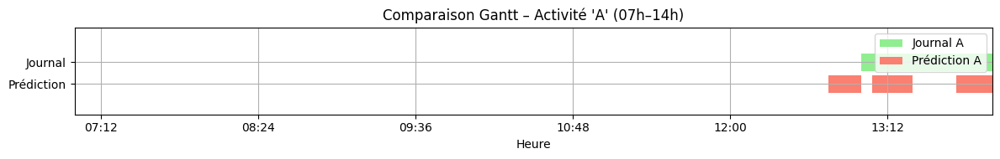

In [35]:

from matplotlib.dates import date2num


# === FILTRAGE DE L’ACTIVITÉ ET DU JOUR ===
# exemple : activité "A", jour spécifique
activity = 'A'
jour = pd.to_datetime("2025-03-03").date()

# Filtrage du journal et des prédictions
journal = activity2[(activity2['activite'] == activity) & (activity2['day'] == jour)]
pred = df_pred[(df_pred['activity'] == activity) & (df_pred['day'] == jour)]

# === CONVERSION POUR GANTT ===
journal_blocks = [(date2num(row['start_time']), (row['end_time'] - row['start_time']).total_seconds() / 3600)
                  for _, row in journal.iterrows()]
pred_blocks = [(date2num(row['start_time']), (row['end_time'] - row['start_time']).total_seconds() / 3600)
               for _, row in pred.iterrows()]

# === FIGURE GANTT ===
fig, ax = plt.subplots(figsize=(12, 2))
ax.broken_barh(journal_blocks, (10, 4), facecolors='lightgreen', label=f'Journal {activity}')
ax.broken_barh(pred_blocks, (5, 4), facecolors='salmon', label=f'Prédiction {activity}')

# === ZOOM SUR UNE PÉRIODE HORAIRE (facultatif) ===
start_zoom = pd.to_datetime(f"{jour} 7:00")
end_zoom = pd.to_datetime(f"{jour} 14:00")
ax.set_xlim(date2num(start_zoom), date2num(end_zoom))

# === MISE EN FORME ===
ax.set_ylim(0, 20)
ax.set_yticks([7, 12])
ax.set_yticklabels(['Prédiction', 'Journal'])
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel("Heure")
ax.set_title(f"Comparaison Gantt – Activité '{activity}' ({start_zoom.strftime('%Hh')}–{end_zoom.strftime('%Hh')})")
ax.grid(True)
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()


In [21]:
print(activity2)

         heure  debut    fin   activite          start_time  \
0   2025-03-03  13:00  13:16          A 2025-03-03 13:00:00   
1   2025-03-03  16:05  16:06          P 2025-03-03 16:05:00   
2   2025-03-03  16:06  16:16          A 2025-03-03 16:06:00   
3   2025-03-03  17:40  17:45          H 2025-03-03 17:40:00   
4   2025-03-03  18:05  20:00       foot 2025-03-03 18:05:00   
5   2025-03-03  21:05  21:05          H 2025-03-03 21:05:00   
6   2025-03-03  21:07  21:07          T 2025-03-03 21:07:00   
7   2025-03-03  21:12  21:12          H 2025-03-03 21:12:00   
8   2025-03-03  21:17  21:18          A 2025-03-03 21:17:00   
9   2025-03-03  21:23  21:38          A 2025-03-03 21:23:00   
10  2025-03-03  21:40  21:41          P 2025-03-03 21:40:00   
11  2025-03-04  07:13  07:13          P 2025-03-04 07:13:00   
12  2025-03-04  07:15  07:28          A 2025-03-04 07:15:00   
13  2025-03-04  07:29  07:29          S 2025-03-04 07:29:00   
14  2025-03-04  07:36  07:36          H 2025-03-04 07:3

In [24]:


df_preds = pd.read_csv('../data/Marion.lnk/detected_all_periods.csv')
df_preds['start_time'] = pd.to_datetime(df_preds['start_time'])
df_preds['end_time'] = pd.to_datetime(df_preds['end_time'])
df_preds['activity'] = df_preds['activity'].astype(str).str.strip().str.upper()

df_journal = pd.read_csv('../data/activity_M2.csv', sep=';', skipinitialspace=True)
df_journal.columns = df_journal.columns.str.strip()
df_journal['start_time'] = pd.to_datetime(df_journal['heure'] + ' ' + df_journal['debut'])
df_journal['end_time'] = pd.to_datetime(df_journal['heure'] + ' ' + df_journal['fin'])
df_journal['activite'] = df_journal['activite'].astype(str).str.strip().str.upper()


In [25]:
tp_results_strict = []
min_overlap_seconds = 5

for _, pred in df_preds.iterrows():
    pred_start = pred['start_time']
    pred_end = pred['end_time']
    pred_label = pred['activity']

    overlapping_truths = df_journal[
        (df_journal['start_time'] < pred_end) &
        (df_journal['end_time'] > pred_start)
    ]

    if overlapping_truths.empty:
        continue

    unique_labels = overlapping_truths['activite'].unique()
    if len(unique_labels) == 1 and unique_labels[0] == pred_label:
        for _, truth in overlapping_truths.iterrows():
            latest_start = max(pred_start, truth['start_time'])
            earliest_end = min(pred_end, truth['end_time'])
            overlap = (earliest_end - latest_start).total_seconds()
            if overlap >= min_overlap_seconds:
                tp_results_strict.append({
                    'activity': pred_label,
                    'start_time': pred_start,
                    'end_time': pred_end,
                    'day': pred_start.date()
                })
                break

df_tp_predictions_strict = pd.DataFrame(tp_results_strict)
print("=== Nombre de vrais TP sans conflit ===")
print(df_tp_predictions_strict.groupby('activity').size())


=== Nombre de vrais TP sans conflit ===
activity
A    48
H     5
P     1
dtype: int64


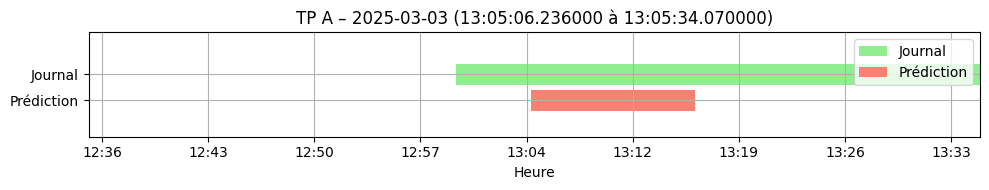

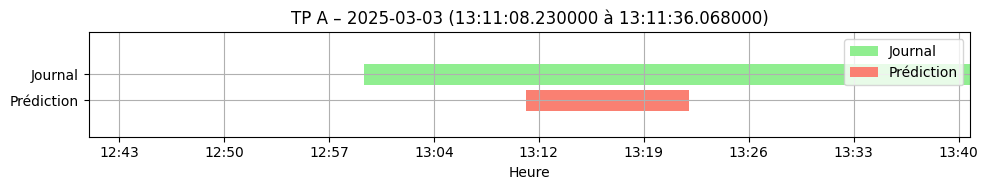

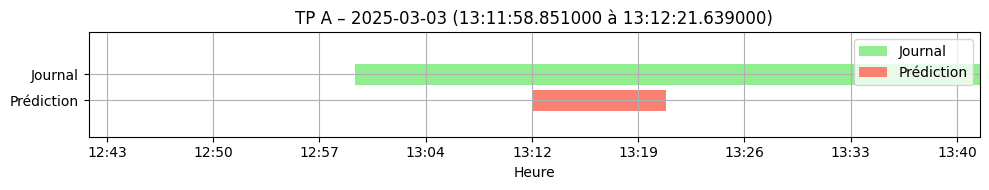

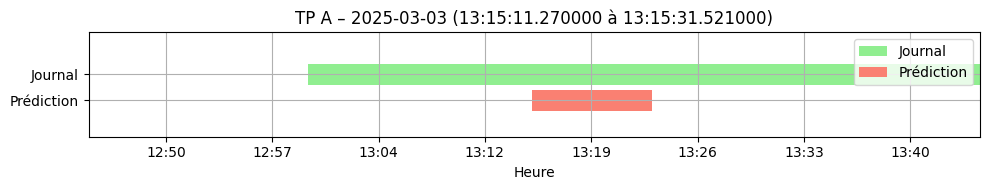

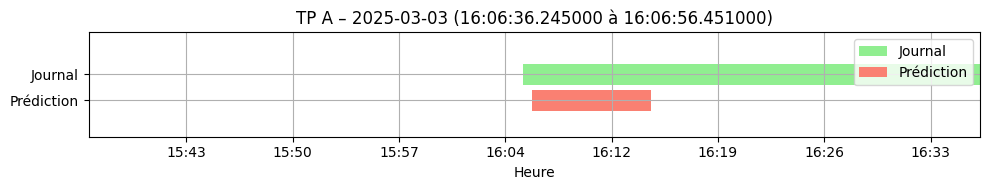

...

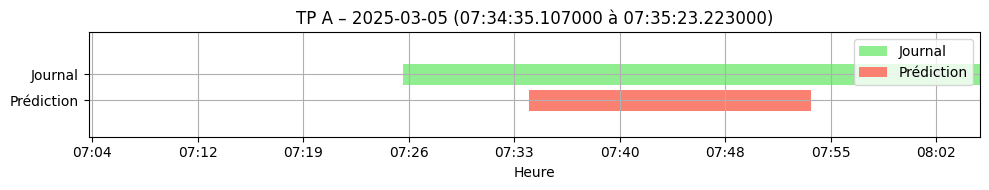

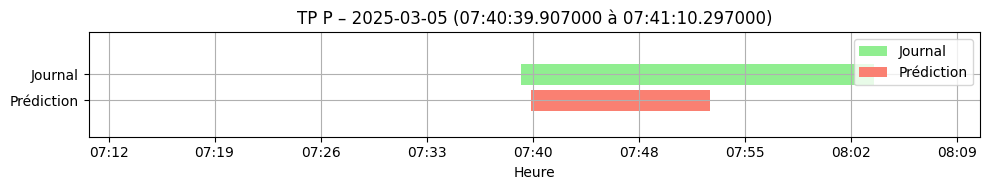

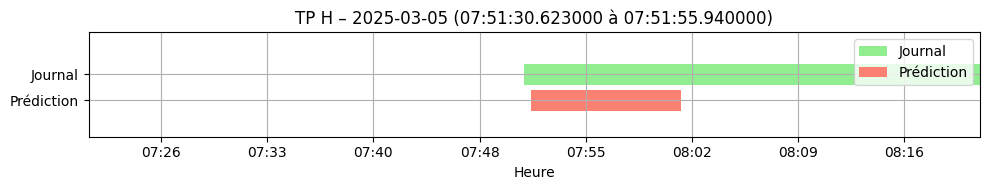

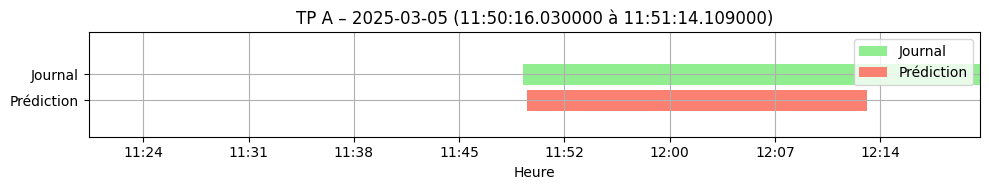

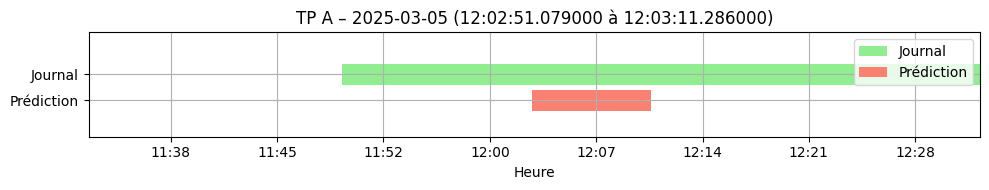

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import date2num

# === CHARGEMENT ET PRÉPARATION DES DONNÉES ===
df_preds = pd.read_csv('../data/Marion.lnk/detected_all_periods.csv')
df_preds['start_time'] = pd.to_datetime(df_preds['start_time'])
df_preds['end_time'] = pd.to_datetime(df_preds['end_time'])
df_preds['activity'] = df_preds['activity'].astype(str).str.strip().str.upper()

df_journal = pd.read_csv('../data/activity_M2.csv', sep=';', skipinitialspace=True)
df_journal.columns = df_journal.columns.str.strip()
df_journal['start_time'] = pd.to_datetime(df_journal['heure'] + ' ' + df_journal['debut'])
df_journal['end_time'] = pd.to_datetime(df_journal['heure'] + ' ' + df_journal['fin'])
df_journal['activite'] = df_journal['activite'].astype(str).str.strip().str.upper()
df_journal['day'] = df_journal['start_time'].dt.date  # ✅ pour le filtrage par jour

# === DÉTECTION STRICTE DES PRÉDICTIONS CORRECTES (True Positives) ===
tp_results_strict = []
min_overlap_seconds = 5

for _, pred in df_preds.iterrows():
    pred_start = pred['start_time']
    pred_end = pred['end_time']
    pred_label = pred['activity']

    overlapping_truths = df_journal[
        (df_journal['start_time'] < pred_end) &
        (df_journal['end_time'] > pred_start)
    ]

    if overlapping_truths.empty:
        continue

    unique_labels = overlapping_truths['activite'].unique()
    if len(unique_labels) == 1 and unique_labels[0] == pred_label:
        for _, truth in overlapping_truths.iterrows():
            latest_start = max(pred_start, truth['start_time'])
            earliest_end = min(pred_end, truth['end_time'])
            overlap = (earliest_end - latest_start).total_seconds()
            if overlap >= min_overlap_seconds:
                tp_results_strict.append({
                    'activity': pred_label,
                    'start_time': pred_start,
                    'end_time': pred_end,
                    'day': pred_start.date()
                })
                break

df_tp_predictions_strict = pd.DataFrame(tp_results_strict)

# === AFFICHAGE GANTT PAR TRUE POSITIVE ===
for i, row in df_tp_predictions_strict.iterrows():
    activity = row['activity']
    jour = row['day']
    pred_start = row['start_time']
    pred_end = row['end_time']

    # Filtrage du journal pour ce jour
    journal = df_journal[df_journal['day'] == jour]

    # Filtrage des activités qui recoupent le TP
    journal_overlap = journal[
        (journal['start_time'] < pred_end) &
        (journal['end_time'] > pred_start)
    ]

    # Conversion des blocs Gantt
    journal_blocks = [(date2num(r['start_time']),
                       (r['end_time'] - r['start_time']).total_seconds() / 3600)
                      for _, r in journal_overlap.iterrows()]
    pred_block = [(date2num(pred_start),
                   (pred_end - pred_start).total_seconds() / 3600)]

    # Zoom : 30 min avant / après la prédiction
    zoom_start = pred_start - pd.Timedelta(minutes=30)
    zoom_end = pred_end + pd.Timedelta(minutes=30)

    # === PLOT FIGURE ===
    fig, ax = plt.subplots(figsize=(10, 2))
    ax.broken_barh(journal_blocks, (10, 4), facecolors='lightgreen', label='Journal')
    ax.broken_barh(pred_block, (5, 4), facecolors='salmon', label='Prédiction')

    ax.set_xlim(date2num(zoom_start), date2num(zoom_end))
    ax.set_ylim(0, 20)
    ax.set_yticks([7, 12])
    ax.set_yticklabels(['Prédiction', 'Journal'])
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    ax.set_xlabel("Heure")
    ax.set_title(f"TP {activity} – {jour} ({pred_start.time()} à {pred_end.time()})")
    ax.grid(True)
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.show()
